In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import StandardScaler
from pipelines.ml_benchmark import run_benchmark_pipeline

In [ ]:
df_btc_price = pd.read_csv("../../data/gold/market/btc_usdt_1d_features.csv")
df_eth_price = pd.read_csv("../../data/gold/market/eth_usdt_1d_features.csv")

In [21]:
df_btc_price.tail(3)
df_btc_price.drop(index=df_btc_price.index[-1], inplace=True)  # Remove last 1 rows with NaN values

In [22]:
df_eth_price.tail(3)

,open_time,open,high,low,close,volume,quote_asset_volume,number_of_trades,taker_buy_base_volume,taker_buy_quote_volume,...,lag_volume_norm,lag_buy_pressure,momentum_acc,volatility_ratio,momentum_volatility,pressure_x_return,ma_7,ma_30,ma_ratio,target
3111,2026-03-24,2152.03,2175.16,2103.02,2156.23,316703.4728,6.781056e+08,4633093,152304.1675,3.261794e+08,...,1.375405,0.504859,-0.045831,0.802529,-0.002194,0.000939,2133.491429,2061.652667,1.034845,False
3112,2026-03-25,2156.22,2199.02,2146.35,2169.02,275641.5255,5.990187e+08,3492121,139003.4847,3.021591e+08,...,0.700419,0.480905,0.003980,0.701538,-0.000414,0.002991,2128.581429,2072.076667,1.027270,False
3113,2026-03-26,2169.02,2172.19,2034.54,2050.58,295625.6093,6.178275e+08,3350726,149541.2850,3.120378e+08,...,0.622068,0.504291,-0.060537,0.811677,-0.001306,-0.027622,2116.120000,2078.698000,1.018003,False


In [23]:
assert df_btc_price["open_time"].equals(df_eth_price["open_time"]), "The open_time columns do not match between BTC and ETH datasets."
assert df_btc_price.isna().sum().sum() == 0, "There are missing values in the BTC price dataset."
assert df_eth_price.isna().sum().sum() == 0, "There are missing values in the ETH price dataset."

In [24]:
# =========================
# 1. COPY DATA
# =========================

df_eth = df_eth_price.copy()

df_eth["open_time"] = pd.to_datetime(df_eth["open_time"])
df_btc_price["open_time"] = pd.to_datetime(df_btc_price["open_time"])


# =========================
# PRIORITY 1 — ETH FEATURES
# =========================

# ETH short-term return (1 day momentum)
df_eth["eth_return_1d"] = df_eth["close"].pct_change()

# ETH medium-term return (7 days trend)
df_eth["eth_return_7d"] = df_eth["close"].pct_change(7)

# ETH short-term volatility (market stress)
df_eth["eth_volatility_7d"] = df_eth["eth_return_1d"].rolling(7).std()

# ETH drawdown (distance from recent peak)
df_eth["eth_cummax"] = df_eth["close"].cummax()
df_eth["eth_drawdown"] = (df_eth["close"] - df_eth["eth_cummax"]) / df_eth["eth_cummax"]


# =========================
# MERGE BTC + ETH
# =========================

df_merged = pd.merge(
    df_btc_price,
    df_eth,
    on="open_time",
    how="inner",
    suffixes=("_btc", "_eth"),
)


# =========================
# PRIORITY 1 — CROSS FEATURES
# =========================

# BTC / ETH price ratio (market dominance)
df_merged["btc_eth_ratio"] = df_merged["close_btc"] / df_merged["close_eth"]

# Change in BTC/ETH ratio (capital rotation)
df_merged["btc_eth_ratio_return_7d"] = df_merged["btc_eth_ratio"].pct_change(7)


# =========================
# PRIORITY 2 — USEFUL FEATURES
# =========================

# ETH medium-short return (3 days acceleration)
df_merged["eth_return_3d"] = df_merged["close_eth"].pct_change(3)

# ETH long-term volatility (market regime)
df_merged["eth_volatility_30d"] = df_merged["eth_return_1d"].rolling(30).std()

# ETH normalized volume (detect abnormal activity)
df_merged["eth_volume_norm"] = (
    df_merged["volume_eth"] / df_merged["volume_eth"].rolling(30).mean()
)

# Relative performance BTC vs ETH
df_merged["btc_minus_eth_return_7d"] = (
    df_merged["return_7d_btc"] - df_merged["eth_return_7d"]
)


# =========================
# PRIORITY 3 — ADVANCED FEATURES
# =========================

# ETH buy pressure (aggressive buying intensity)
df_merged["eth_buy_pressure"] = (
    df_merged["taker_buy_base_volume_eth"] / df_merged["volume_eth"]
)

# Relative volatility BTC vs ETH
df_merged["btc_eth_vol_ratio"] = (
    df_merged["volatility_7d_btc"] / df_merged["eth_volatility_7d"]
)

# Global market proxy (combined momentum)
df_merged["market_return_proxy_7d"] = (
    0.5 * df_merged["return_7d_btc"] + 0.5 * df_merged["eth_return_7d"]
)


# =========================
# FINAL FEATURE SELECTION
# =========================

eth_feature_cols = [
    "open_time",

    # PRIORITY 1
    "eth_return_1d",
    "eth_return_7d",
    "eth_volatility_7d",
    "eth_drawdown",
    "btc_eth_ratio",
    "btc_eth_ratio_return_7d",

    # PRIORITY 2
    "eth_return_3d",
    "eth_volatility_30d",
    "eth_volume_norm",
    "btc_minus_eth_return_7d",

    # PRIORITY 3
    "eth_buy_pressure",
    "btc_eth_vol_ratio",
    "market_return_proxy_7d",
]

df_eth_features = df_merged[eth_feature_cols].copy()


# =========================
# CLEAN NA
# =========================

df_eth_features = df_eth_features.dropna().reset_index(drop=True)

In [25]:
df_eth_features.columns

Index(['open_time', 'eth_return_1d', 'eth_return_7d', 'eth_volatility_7d',
       'eth_drawdown', 'btc_eth_ratio', 'btc_eth_ratio_return_7d',
       'eth_return_3d', 'eth_volatility_30d', 'eth_volume_norm',
       'btc_minus_eth_return_7d', 'eth_buy_pressure', 'btc_eth_vol_ratio',
       'market_return_proxy_7d'],
      dtype='str')

In [26]:
# =========================
# FEATURE SELECTION MODE
# =========================

PRIORITY_LEVEL = 2# change to 2 or 3 easily


priority_1 = [
    "eth_return_1d",
    "eth_return_7d",
    "eth_volatility_7d",
    "eth_drawdown",
    "btc_eth_ratio",
    "btc_eth_ratio_return_7d",
]

priority_2 = [
    "eth_return_3d",
    "eth_volatility_30d",
    "eth_volume_norm",
    "btc_minus_eth_return_7d",
]

priority_3 = [
    "eth_buy_pressure",
    "btc_eth_vol_ratio",
    "market_return_proxy_7d",
]


# Build feature list dynamically
selected_features = ["open_time"]

if PRIORITY_LEVEL >= 1:
    selected_features += priority_1

if PRIORITY_LEVEL >= 2:
    selected_features += priority_2

if PRIORITY_LEVEL >= 3:
    selected_features += priority_3


# Final dataframe
df_eth_features = df_merged[selected_features].copy()

# Clean
df_eth_features = df_eth_features.dropna().reset_index(drop=True)

In [27]:
# =========================
# MERGE FEATURES INTO BTC
# =========================

df_features = df_merged[selected_features].copy()

# Merge back into BTC dataframe
df_btc_price = pd.merge(
    df_btc_price,
    df_features,
    on="open_time",
    how="left"
)

# Clean
df_btc_price = df_btc_price.dropna().reset_index(drop=True)

In [28]:
SELECTED_FEATURES = [
    # Momentum
    "return_1d", "return_7d",

    # Volatility
    "volatility_7d", "volatility_30d",

    # Market behavior
    "buy_pressure",

    # Risk
    "drawdown",

    # Trend
    "ma_ratio",

    # Lags
    "lag_return_1d", "lag_return_7d",
    "lag_volatility_7d",
    "lag_buy_pressure",
    "lag_volume_norm",

    # Additional
    "momentum_acc",
    "momentum_volatility",
    "volume",
    "number_of_trades",
    "quote_asset_volume",

    # ETH features
    "eth_return_1d",
    "eth_return_7d",
    "eth_volatility_7d",
    "eth_drawdown",
    "btc_eth_ratio",
    "btc_eth_ratio_return_7d",

    # Additional ETH features
    "eth_return_3d",
    "eth_volatility_30d",
    "eth_volume_norm",
    "btc_minus_eth_return_7d",

]

TARGET = "target"

df_btc_price = df_btc_price[SELECTED_FEATURES + [TARGET]]
df_btc_price.head()

,return_1d,return_7d,volatility_7d,volatility_30d,buy_pressure,drawdown,ma_ratio,lag_return_1d,lag_return_7d,lag_volatility_7d,...,eth_return_7d,eth_volatility_7d,eth_drawdown,btc_eth_ratio,btc_eth_ratio_return_7d,eth_return_3d,eth_volatility_30d,eth_volume_norm,btc_minus_eth_return_7d,target
0,0.008762,0.203276,0.049289,0.041585,0.470386,-0.018734,1.227793,-0.027257,0.230601,0.048571,...,0.127864,0.042620,-0.019912,17.184343,0.066862,-0.008196,0.047625,1.634143,0.075411,1
1,-0.028649,0.169753,0.052965,0.042222,0.481699,-0.046847,1.236358,0.008762,0.203276,0.049289,...,0.055418,0.051917,-0.078392,17.751198,0.108332,-0.078392,0.049127,1.503289,0.114335,0
2,-0.014824,0.143242,0.054772,0.040022,0.448538,-0.060976,1.244688,-0.028649,0.169753,0.052965,...,0.018716,0.052599,-0.094444,17.798063,0.122237,-0.083619,0.042063,2.259806,0.124525,0
3,0.031175,0.046759,0.030691,0.039367,0.460308,-0.031702,1.236566,-0.014824,0.143242,0.054772,...,0.015362,0.052654,-0.097485,18.414761,0.030921,-0.079149,0.041454,1.461320,0.031396,0
4,0.057374,0.063722,0.034222,0.040050,0.422224,0.000000,1.228949,0.031175,0.046759,0.030691,...,-0.098976,0.022063,-0.109620,19.736659,0.180571,-0.033884,0.041527,1.410720,0.162699,0


In [29]:
assert df_btc_price.isna().sum().sum() == 0, "There are missing values in the final BTC price dataset after merging features."


In [30]:
target = "target"
assert target in df_btc_price.columns, f"The target column '{target}' is missing from the BTC price dataset."

[I 2026-03-27 23:44:00,585] A new study created in memory with name: no-name-51085db4-2757-4461-9346-6f3ea0c09ef6
[I 2026-03-27 23:44:00,599] Trial 0 finished with value: 0.12262773722627737 and parameters: {}. Best is trial 0 with value: 0.12262773722627737.
[I 2026-03-27 23:44:00,610] Trial 1 finished with value: 0.12262773722627737 and parameters: {}. Best is trial 0 with value: 0.12262773722627737.
[I 2026-03-27 23:44:00,620] Trial 2 finished with value: 0.12262773722627737 and parameters: {}. Best is trial 0 with value: 0.12262773722627737.
[I 2026-03-27 23:44:00,630] Trial 3 finished with value: 0.12262773722627737 and parameters: {}. Best is trial 0 with value: 0.12262773722627737.
[I 2026-03-27 23:44:00,640] Trial 4 finished with value: 0.12262773722627737 and parameters: {}. Best is trial 0 with value: 0.12262773722627737.
[I 2026-03-27 23:44:00,652] Trial 5 finished with value: 0.12262773722627737 and parameters: {}. Best is trial 0 with value: 0.12262773722627737.
[I 2026-03


MODEL: dummy


[I 2026-03-27 23:44:00,792] Trial 19 finished with value: 0.12262773722627737 and parameters: {}. Best is trial 0 with value: 0.12262773722627737.
[I 2026-03-27 23:44:00,803] Trial 20 finished with value: 0.12262773722627737 and parameters: {}. Best is trial 0 with value: 0.12262773722627737.
[I 2026-03-27 23:44:00,816] Trial 21 finished with value: 0.12262773722627737 and parameters: {}. Best is trial 0 with value: 0.12262773722627737.
[I 2026-03-27 23:44:00,827] Trial 22 finished with value: 0.12262773722627737 and parameters: {}. Best is trial 0 with value: 0.12262773722627737.
[I 2026-03-27 23:44:00,837] Trial 23 finished with value: 0.12262773722627737 and parameters: {}. Best is trial 0 with value: 0.12262773722627737.
[I 2026-03-27 23:44:00,845] Trial 24 finished with value: 0.12262773722627737 and parameters: {}. Best is trial 0 with value: 0.12262773722627737.
[I 2026-03-27 23:44:00,855] Trial 25 finished with value: 0.12262773722627737 and parameters: {}. Best is trial 0 with


=== OPTUNA RESULTS ===
Best trial: 0
Best score (PR-AUC): 0.12262773722627737
Best params: {}

=== Best Threshold === 0.1783

=== Metrics ===
{'precision': 0.1573398215733982, 'recall': 0.7698412698412699, 'f1': 0.2612794612794613, 'TP': 194.0, 'FP': 1039.0, 'FN': 58.0, 'TN': 764.0, 'pr_auc': 0.14387366598437157}

=== Global Confusion Matrix ===


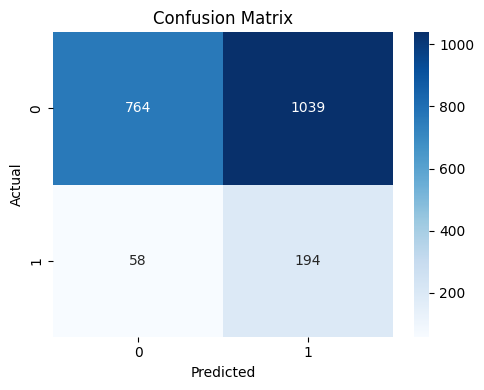

[I 2026-03-27 23:44:01,859] A new study created in memory with name: no-name-efc550c4-7d79-4dba-926c-ddda46b269fe



MODEL: logistic


/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/sklearn/linea


=== OPTUNA RESULTS ===
Best trial: 23
Best score (PR-AUC): 0.6567041246730335
Best params: {'penalty': 'l1', 'solver': 'liblinear', 'C': 24.798262370309107}


/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1160: UserWarning: Inconsistent values: penalty=l1 with l1_ratio=0.0. penalty is deprecated. Please use l1_ratio only.
  warnings.warn(
/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use '


=== Best Threshold === 0.5000

=== Metrics ===
{'precision': 0.43564356435643564, 'recall': 0.873015873015873, 'f1': 0.5812417437252312, 'TP': 220.0, 'FP': 285.0, 'FN': 32.0, 'TN': 1518.0, 'pr_auc': 0.6158951725983971}

=== Global Confusion Matrix ===


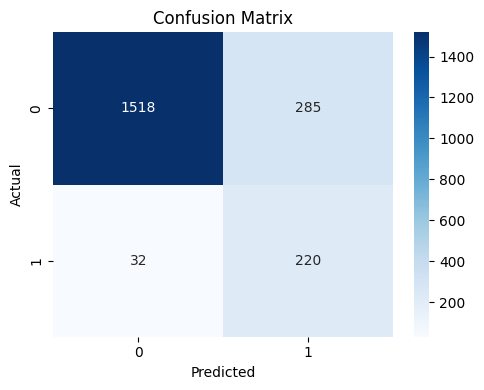

[I 2026-03-27 23:46:18,969] A new study created in memory with name: no-name-ab7b3755-d4bf-4b38-8fc1-2dbe0630e191



MODEL: random_forest


[I 2026-03-27 23:46:24,875] Trial 0 finished with value: 0.7483040439760917 and parameters: {'n_estimators': 540, 'max_depth': 6, 'min_samples_leaf': 10, 'min_samples_split': 13, 'max_features': 0.5, 'bootstrap': True}. Best is trial 0 with value: 0.7483040439760917.
[I 2026-03-27 23:46:30,431] Trial 1 finished with value: 0.7326352863067103 and parameters: {'n_estimators': 656, 'max_depth': 6, 'min_samples_leaf': 10, 'min_samples_split': 9, 'max_features': 'log2', 'bootstrap': False}. Best is trial 0 with value: 0.7483040439760917.
[I 2026-03-27 23:46:35,387] Trial 2 finished with value: 0.7378329106273661 and parameters: {'n_estimators': 466, 'max_depth': 7, 'min_samples_leaf': 4, 'min_samples_split': 2, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.7483040439760917.
[I 2026-03-27 23:46:43,875] Trial 3 finished with value: 0.7242930282560077 and parameters: {'n_estimators': 719, 'max_depth': 9, 'min_samples_leaf': 5, 'min_samples_split': 7, 'max_features':


=== OPTUNA RESULTS ===
Best trial: 62
Best score (PR-AUC): 0.7542654413312845
Best params: {'n_estimators': 332, 'max_depth': 9, 'min_samples_leaf': 8, 'min_samples_split': 8, 'max_features': 0.5, 'bootstrap': True}

=== Best Threshold === 0.4951

=== Metrics ===
{'precision': 0.6201298701298701, 'recall': 0.7579365079365079, 'f1': 0.6821428571428572, 'TP': 191.0, 'FP': 117.0, 'FN': 61.0, 'TN': 1686.0, 'pr_auc': 0.7542654413312845}

=== Global Confusion Matrix ===


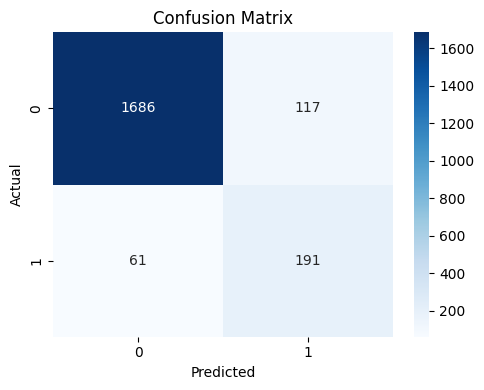

[I 2026-03-27 23:51:30,938] A new study created in memory with name: no-name-63249d26-9ca5-48f6-8a42-f8d24ea3e494



MODEL: xgboost


[I 2026-03-27 23:51:37,600] Trial 0 finished with value: 0.7589536780004944 and parameters: {'n_estimators': 629, 'max_depth': 8, 'learning_rate': 0.013304792531872804, 'subsample': 0.801813562177092, 'colsample_bytree': 0.8320554168888322, 'gamma': 1.388460467946722, 'reg_alpha': 0.8200118820803265, 'reg_lambda': 3.965969195071538}. Best is trial 0 with value: 0.7589536780004944.
[I 2026-03-27 23:51:39,637] Trial 1 finished with value: 0.752681449993045 and parameters: {'n_estimators': 635, 'max_depth': 10, 'learning_rate': 0.1493790466620499, 'subsample': 0.6829666209276175, 'colsample_bytree': 0.6253828798585818, 'gamma': 3.718695805299472, 'reg_alpha': 2.305210033840617, 'reg_lambda': 1.4459149857654423}. Best is trial 0 with value: 0.7589536780004944.
[I 2026-03-27 23:51:49,073] Trial 2 finished with value: 0.7702491635857168 and parameters: {'n_estimators': 541, 'max_depth': 6, 'learning_rate': 0.029586598468996687, 'subsample': 0.6864066182361203, 'colsample_bytree': 0.655622951


=== OPTUNA RESULTS ===
Best trial: 91
Best score (PR-AUC): 0.7740729753323733
Best params: {'n_estimators': 592, 'max_depth': 9, 'learning_rate': 0.11039482344009749, 'subsample': 0.6678785961285203, 'colsample_bytree': 0.7293537942064171, 'gamma': 2.7115966089006336, 'reg_alpha': 1.0360296247679035, 'reg_lambda': 2.0422381840135397}

=== Best Threshold === 0.3911

=== Metrics ===
{'precision': 0.7176470588235294, 'recall': 0.7261904761904762, 'f1': 0.7218934911242604, 'TP': 183.0, 'FP': 72.0, 'FN': 69.0, 'TN': 1731.0, 'pr_auc': 0.7740729753323733}

=== Global Confusion Matrix ===


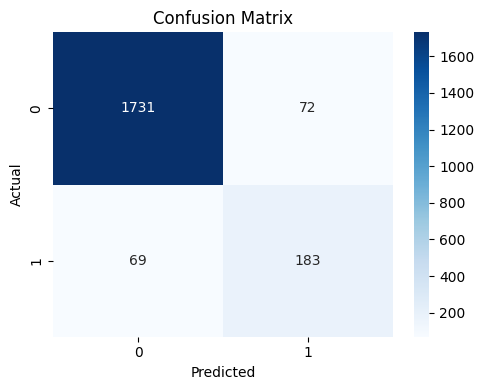

[I 2026-03-27 23:54:52,822] A new study created in memory with name: no-name-ea6fabf3-bcb1-4154-8aea-6f43756fe1f7



MODEL: lightgbm
[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.225728 -> initscore=-1.232592
[LightGBM] [Info] Start training from score -1.232592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[I 2026-03-27 23:54:54,332] Trial 0 finished with value: 0.7577731130698613 and parameters: {'n_estimators': 352, 'max_depth': 7, 'learning_rate': 0.12521763941375907, 'num_leaves': 113, 'subsample': 0.8526237821948723, 'colsample_bytree': 0.6846482090344939, 'reg_alpha': 2.5632775857265826, 'reg_lambda': 3.6926855932077167}. Best is trial 0 with value: 0.7577731130698613.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:54:55,776] Trial 1 finished with value: 0.7526629087219169 and parameters: {'n_estimators': 328, 'max_depth': 3, 'learning_rate': 0.012525226628875685, 'num_leaves': 65, 'subsample': 0.6920062674167798, 'colsample_bytree': 0.6563461053017149, 'reg_alpha': 2.5049621436018263, 'reg_lambda': 4.339252210301216}. Best is trial 0 with value: 0.7577731130698613.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, 

[I 2026-03-27 23:55:00,668] Trial 2 finished with value: 0.7588398821430083 and parameters: {'n_estimators': 536, 'max_depth': 6, 'learning_rate': 0.05553455226190889, 'num_leaves': 39, 'subsample': 0.6327632276834976, 'colsample_bytree': 0.8785213758760098, 'reg_alpha': 0.3638980296213723, 'reg_lambda': 0.13804181124338732}. Best is trial 2 with value: 0.7588398821430083.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits wit

[I 2026-03-27 23:55:02,264] Trial 3 finished with value: 0.7619493383345712 and parameters: {'n_estimators': 731, 'max_depth': 4, 'learning_rate': 0.14705458493927703, 'num_leaves': 119, 'subsample': 0.7920253746257573, 'colsample_bytree': 0.9570642869611821, 'reg_alpha': 3.15620807642283, 'reg_lambda': 1.4546758972954215}. Best is trial 3 with value: 0.7619493383345712.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:55:06,139] Trial 4 finished with value: 0.7554867372724124 and parameters: {'n_estimators': 525, 'max_depth': 4, 'learning_rate': 0.010593705256332422, 'num_leaves': 21, 'subsample': 0.9665207501134417, 'colsample_bytree': 0.7480837591486765, 'reg_alpha': 0.8389326094611455, 'reg_lambda': 0.7596858772240411}. Best is trial 3 with value: 0.7619493383345712.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:55:06,427] Trial 5 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:55:06,518] Trial 6 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:55:07,473] Trial 7 pruned. 


[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.225728 -> initscore=-1.232592
[LightGBM] [Info] Start training from score -1.232592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2026-03-27 23:55:08,323] Trial 8 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:55:08,494] Trial 9 pruned. 


[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.225728 -> initscore=-1.232592
[LightGBM] [Info] Start training from score -1.232592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2026-03-27 23:55:09,012] Trial 10 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:55:09,299] Trial 11 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:55:12,232] Trial 12 finished with value: 0.7596230725235908 and parameters: {'n_estimators': 792, 'max_depth': 6, 'learning_rate': 0.060744391449235186, 'num_leaves': 93, 'subsample': 0.8178631850522898, 'colsample_bytree': 0.8556131980681343, 'reg_alpha': 3.3941054830438135, 'reg_lambda': 2.012890090495926}. Best is trial 3 with value: 0.7619493383345712.


[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[I 2026-03-27 23:55:12,779] Trial 13 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:55:13,547] Trial 14 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:55:14,284] Trial 15 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:55:19,354] Trial 16 finished with value: 0.7734788337415353 and parameters: {'n_estimators': 414, 'max_depth': 4, 'learning_rate': 0.04020043781964873, 'num_leaves': 107, 'subsample': 0.8024693302066992, 'colsample_bytree': 0.7815225676817682, 'reg_alpha': 1.800497290422757, 'reg_lambda': 1.056565108939915}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:55:24,220] Trial 17 finished with value: 0.7669878831264499 and parameters: {'n_estimators': 448, 'max_depth': 4, 'learning_rate': 0.01770900554752275, 'num_leaves': 109, 'subsample': 0.8908450000909659, 'colsample_bytree': 0.6088436195101125, 'reg_alpha': 1.706279594679915, 'reg_lambda': 1.0414792591298825}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:55:26,580] Trial 18 finished with value: 0.7646966701090107 and parameters: {'n_estimators': 447, 'max_depth': 3, 'learning_rate': 0.017294312816015622, 'num_leaves': 72, 'subsample': 0.9169139365193673, 'colsample_bytree': 0.6181985965974175, 'reg_alpha': 1.4888575593447504, 'reg_lambda': 0.8799076678141904}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:55:29,917] Trial 19 finished with value: 0.7655465135817239 and parameters: {'n_estimators': 450, 'max_depth': 4, 'learning_rate': 0.022488122466944985, 'num_leaves': 102, 'subsample': 0.930415856741944, 'colsample_bytree': 0.7800034483299068, 'reg_alpha': 1.8156286208625305, 'reg_lambda': 0.7816196946607863}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:55:34,244] Trial 20 finished with value: 0.7730322117652754 and parameters: {'n_estimators': 414, 'max_depth': 5, 'learning_rate': 0.03811943672535372, 'num_leaves': 140, 'subsample': 0.8703136597784339, 'colsample_bytree': 0.6223158848850002, 'reg_alpha': 2.041572111579935, 'reg_lambda': 1.0834276116000352}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000667 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, 

[I 2026-03-27 23:55:39,144] Trial 21 finished with value: 0.7679817095444498 and parameters: {'n_estimators': 411, 'max_depth': 5, 'learning_rate': 0.03786650152968612, 'num_leaves': 145, 'subsample': 0.8762691507815512, 'colsample_bytree': 0.6032678983647884, 'reg_alpha': 2.00578262687624, 'reg_lambda': 1.06786405946293}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.225728 -> initscore=-1.232592
[LightGBM] [Info] Start training from score -1.232592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2026-03-27 23:55:39,629] Trial 22 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training beca

[I 2026-03-27 23:55:40,147] Trial 23 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:55:40,596] Trial 24 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no 

[I 2026-03-27 23:55:41,143] Trial 25 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves 

[I 2026-03-27 23:55:41,495] Trial 26 pruned. 


[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.225728 -> initscore=-1.232592
[LightGBM] [Info] Start training from score -1.232592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2026-03-27 23:55:44,098] Trial 27 finished with value: 0.7677627013998977 and parameters: {'n_estimators': 393, 'max_depth': 3, 'learning_rate': 0.03226709059391268, 'num_leaves': 129, 'subsample': 0.6855302444027855, 'colsample_bytree': 0.6389880491195039, 'reg_alpha': 2.8563695799299795, 'reg_lambda': 2.3806012698165784}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:55:45,081] Trial 28 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:55:45,391] Trial 29 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:55:46,018] Trial 30 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:55:46,431] Trial 31 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spl

[I 2026-03-27 23:55:48,902] Trial 32 finished with value: 0.7667190766307577 and parameters: {'n_estimators': 364, 'max_depth': 3, 'learning_rate': 0.03189374541572141, 'num_leaves': 124, 'subsample': 0.7049615195848163, 'colsample_bytree': 0.6513866589535501, 'reg_alpha': 2.3340909646514123, 'reg_lambda': 3.5083925220622376}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.225728 -> initscore=-1.232592
[LightGBM] [Info] Start training from score -1.232592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2026-03-27 23:55:49,413] Trial 33 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:55:51,727] Trial 34 finished with value: 0.7701321363521763 and parameters: {'n_estimators': 492, 'max_depth': 4, 'learning_rate': 0.05628166449289675, 'num_leaves': 114, 'subsample': 0.7803226089107251, 'colsample_bytree': 0.6609923723255297, 'reg_alpha': 2.845614365020811, 'reg_lambda': 1.8312737706745126}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.225728 -> initscore=-1.232592
[LightGBM] [Info] Start training from score -1.232592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2026-03-27 23:55:54,294] Trial 35 finished with value: 0.7680421742365247 and parameters: {'n_estimators': 497, 'max_depth': 4, 'learning_rate': 0.05637221813460847, 'num_leaves': 114, 'subsample': 0.786069717927264, 'colsample_bytree': 0.6697326029158206, 'reg_alpha': 2.5742270120704713, 'reg_lambda': 1.9336116511258603}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:55:54,839] Trial 36 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2026-03-27 23:55:55,117] Trial 37 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:55:57,795] Trial 38 finished with value: 0.7686309780037311 and parameters: {'n_estimators': 472, 'max_depth': 4, 'learning_rate': 0.052792416682609915, 'num_leaves': 81, 'subsample': 0.7900952890176289, 'colsample_bytree': 0.7047349842022792, 'reg_alpha': 2.428908768668469, 'reg_lambda': 1.346064561771176}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:55:58,609] Trial 39 pruned. 


[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[I 2026-03-27 23:55:59,002] Trial 40 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2026-03-27 23:56:01,719] Trial 41 finished with value: 0.7681040910562853 and parameters: {'n_estimators': 525, 'max_depth': 4, 'learning_rate': 0.05302504491803796, 'num_leaves': 92, 'subsample': 0.7904002207851807, 'colsample_bytree': 0.6780555891799857, 'reg_alpha': 2.457309197000505, 'reg_lambda': 1.9640241312020401}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:56:05,068] Trial 42 finished with value: 0.7666638680558713 and parameters: {'n_estimators': 551, 'max_depth': 4, 'learning_rate': 0.04405660974412921, 'num_leaves': 88, 'subsample': 0.8430409926970915, 'colsample_bytree': 0.6876198954099483, 'reg_alpha': 2.345414807752319, 'reg_lambda': 2.630370688304007}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.225728 -> initscore=-1.232592
[LightGBM] [Info] Start training from score -1.232592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[I 2026-03-27 23:56:07,380] Trial 43 finished with value: 0.7683500394507409 and parameters: {'n_estimators': 521, 'max_depth': 4, 'learning_rate': 0.05279826319058146, 'num_leaves': 58, 'subsample': 0.7169863713175904, 'colsample_bytree': 0.6635898194602812, 'reg_alpha': 2.8030483671836617, 'reg_lambda': 1.4144700825846728}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:56:07,782] Trial 44 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, 

[I 2026-03-27 23:56:08,349] Trial 45 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:56:08,591] Trial 46 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:56:08,965] Trial 47 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:56:12,921] Trial 48 finished with value: 0.7680110530935861 and parameters: {'n_estimators': 596, 'max_depth': 4, 'learning_rate': 0.02822889047224267, 'num_leaves': 121, 'subsample': 0.7476994473988675, 'colsample_bytree': 0.6574745018422371, 'reg_alpha': 1.8252062879279118, 'reg_lambda': 0.5936987226815901}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:13,712] Trial 49 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:14,121] Trial 50 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:56:16,824] Trial 51 finished with value: 0.7696945263448665 and parameters: {'n_estimators': 530, 'max_depth': 4, 'learning_rate': 0.04948849875336595, 'num_leaves': 94, 'subsample': 0.795059056600983, 'colsample_bytree': 0.680070178389054, 'reg_alpha': 2.4319479213462616, 'reg_lambda': 1.6305012259839744}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:17,369] Trial 52 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:19,819] Trial 53 finished with value: 0.768505973533088 and parameters: {'n_estimators': 464, 'max_depth': 5, 'learning_rate': 0.06524353466256852, 'num_leaves': 80, 'subsample': 0.7998717528167947, 'colsample_bytree': 0.657368758688325, 'reg_alpha': 2.1347888595081557, 'reg_lambda': 1.3976642777407058}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:20,334] Trial 54 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, 

[I 2026-03-27 23:56:21,141] Trial 55 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:56:23,636] Trial 56 finished with value: 0.7636407074528481 and parameters: {'n_estimators': 461, 'max_depth': 5, 'learning_rate': 0.06299923478133664, 'num_leaves': 99, 'subsample': 0.7981419554968685, 'colsample_bytree': 0.7103061785205548, 'reg_alpha': 2.4479741805582025, 'reg_lambda': 1.7182268218400898}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [W

[I 2026-03-27 23:56:26,464] Trial 57 finished with value: 0.7706173724596782 and parameters: {'n_estimators': 552, 'max_depth': 5, 'learning_rate': 0.10808532754027024, 'num_leaves': 85, 'subsample': 0.8483635261033767, 'colsample_bytree': 0.8515575157108337, 'reg_alpha': 1.634106038996789, 'reg_lambda': 4.843148564744464}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:56:26,946] Trial 58 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2026-03-27 23:56:27,409] Trial 59 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:56:29,619] Trial 60 finished with value: 0.7682138880247201 and parameters: {'n_estimators': 659, 'max_depth': 4, 'learning_rate': 0.13882941811776517, 'num_leaves': 107, 'subsample': 0.91238769673807, 'colsample_bytree': 0.8461077179005717, 'reg_alpha': 1.4907480067472179, 'reg_lambda': 4.94379514792292}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.225728 -> initscore=-1.232592
[LightGBM] [Info] Start training from score -1.232592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2026-03-27 23:56:29,909] Trial 61 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training beca

[I 2026-03-27 23:56:35,545] Trial 62 finished with value: 0.7641182182284828 and parameters: {'n_estimators': 505, 'max_depth': 6, 'learning_rate': 0.042936617809304786, 'num_leaves': 95, 'subsample': 0.8047115800301479, 'colsample_bytree': 0.8017121458011726, 'reg_alpha': 1.7903140213686888, 'reg_lambda': 4.3305350555501265}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.225728 -> initscore=-1.232592
[LightGBM] [Info] Start training from score -1.232592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2026-03-27 23:56:36,394] Trial 63 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wis

[I 2026-03-27 23:56:38,659] Trial 64 finished with value: 0.7701140385060575 and parameters: {'n_estimators': 463, 'max_depth': 5, 'learning_rate': 0.07717525385055968, 'num_leaves': 84, 'subsample': 0.8813554270141999, 'colsample_bytree': 0.90458006018869, 'reg_alpha': 2.167520416556469, 'reg_lambda': 1.268298902730747}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:56:40,786] Trial 65 finished with value: 0.7674585574944932 and parameters: {'n_estimators': 400, 'max_depth': 4, 'learning_rate': 0.07406102808385, 'num_leaves': 75, 'subsample': 0.88227555316677, 'colsample_bytree': 0.9064062579257183, 'reg_alpha': 2.5782683668681554, 'reg_lambda': 4.104020666888927}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:41,193] Trial 66 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:41,713] Trial 67 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:56:42,034] Trial 68 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:42,603] Trial 69 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:42,851] Trial 70 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:46,118] Trial 71 finished with value: 0.7705068667920035 and parameters: {'n_estimators': 462, 'max_depth': 5, 'learning_rate': 0.05068670288736897, 'num_leaves': 78, 'subsample': 0.8245124982117806, 'colsample_bytree': 0.6269066608651183, 'reg_alpha': 2.097332980553416, 'reg_lambda': 1.394771673098416}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.225728 -> initscore=-1.232592
[LightGBM] [Info] Start training from score -1.232592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2026-03-27 23:56:46,880] Trial 72 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:47,337] Trial 73 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:50,182] Trial 74 finished with value: 0.7719444875643195 and parameters: {'n_estimators': 440, 'max_depth': 4, 'learning_rate': 0.04821763832835659, 'num_leaves': 117, 'subsample': 0.8961428813640514, 'colsample_bytree': 0.6441891994131022, 'reg_alpha': 1.982387222681278, 'reg_lambda': 0.8764419619941031}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:52,608] Trial 75 finished with value: 0.7728818989889906 and parameters: {'n_estimators': 438, 'max_depth': 4, 'learning_rate': 0.04611908619023906, 'num_leaves': 118, 'subsample': 0.9320326081161548, 'colsample_bytree': 0.6155403854557983, 'reg_alpha': 1.6964960010520211, 'reg_lambda': 0.6992406706863519}. Best is trial 16 with value: 0.7734788337415353.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:53,048] Trial 76 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:56:53,924] Trial 77 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:54,585] Trial 78 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:55,485] Trial 79 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000427 seconds.
You c

[I 2026-03-27 23:56:56,216] Trial 80 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:56:57,241] Trial 81 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:57:00,565] Trial 82 finished with value: 0.7743130527736096 and parameters: {'n_estimators': 513, 'max_depth': 4, 'learning_rate': 0.04912867132605613, 'num_leaves': 113, 'subsample': 0.9021471828720757, 'colsample_bytree': 0.6300687457959138, 'reg_alpha': 2.0213613404528425, 'reg_lambda': 1.8743211790583802}. Best is trial 82 with value: 0.7743130527736096.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2026-03-27 23:57:01,263] Trial 83 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:57:01,612] Trial 84 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stop

[I 2026-03-27 23:57:05,196] Trial 85 finished with value: 0.7722396335153418 and parameters: {'n_estimators': 567, 'max_depth': 4, 'learning_rate': 0.05497576304005402, 'num_leaves': 114, 'subsample': 0.9784641274683895, 'colsample_bytree': 0.6120221774348459, 'reg_alpha': 1.8714027941895126, 'reg_lambda': 1.4836187762522282}. Best is trial 82 with value: 0.7743130527736096.


[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.225728 -> initscore=-1.232592
[LightGBM] [Info] Start training from score -1.232592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2026-03-27 23:57:06,031] Trial 86 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:57:06,466] Trial 87 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:57:07,038] Trial 88 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:57:08,702] Trial 89 finished with value: 0.764223955503711 and parameters: {'n_estimators': 575, 'max_depth': 4, 'learning_rate': 0.1854662459173349, 'num_leaves': 107, 'subsample': 0.9029806103879202, 'colsample_bytree': 0.6353331492692825, 'reg_alpha': 1.6899259952611694, 'reg_lambda': 2.3235230753542355}. Best is trial 82 with value: 0.7743130527736096.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:57:11,167] Trial 90 finished with value: 0.7697765274570368 and parameters: {'n_estimators': 548, 'max_depth': 3, 'learning_rate': 0.04919358632237388, 'num_leaves': 122, 'subsample': 0.9835798085469462, 'colsample_bytree': 0.6501264449568005, 'reg_alpha': 2.0181659811567454, 'reg_lambda': 3.6257528787124427}. Best is trial 82 with value: 0.7743130527736096.


[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.225728 -> initscore=-1.232592
[LightGBM] [Info] Start training from score -1.232592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2026-03-27 23:57:14,432] Trial 91 finished with value: 0.7700963873179623 and parameters: {'n_estimators': 419, 'max_depth': 4, 'learning_rate': 0.04517964560832431, 'num_leaves': 113, 'subsample': 0.9209471059151011, 'colsample_bytree': 0.609576377156764, 'reg_alpha': 2.0902105433145826, 'reg_lambda': 1.3200639997066637}. Best is trial 82 with value: 0.7743130527736096.


[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.225728 -> initscore=-1.232592
[LightGBM] [Info] Start training from score -1.232592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2026-03-27 23:57:15,227] Trial 92 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:57:15,614] Trial 93 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:57:16,407] Trial 94 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:57:16,949] Trial 95 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:57:17,538] Trial 96 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:57:18,141] Trial 97 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, 

[I 2026-03-27 23:57:18,716] Trial 98 pruned. 


[LightGBM] [Info] Number of positive: 93, number of negative: 319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3707
[LightGBM] [Info] Number of data points in the train set: 412, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.225728 -> initscore=-1.232592
[LightGBM] [Info] Start training from score -1.232592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2026-03-27 23:57:19,181] Trial 99 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

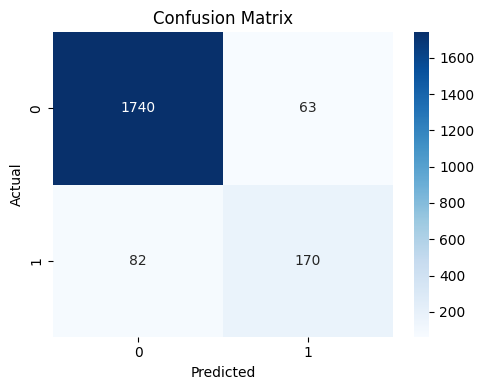

[I 2026-03-27 23:57:23,193] A new study created in memory with name: no-name-9b02c528-689c-4807-9171-60fc1616fa42



MODEL: catboost


[I 2026-03-27 23:57:28,782] Trial 0 finished with value: 0.740424511649133 and parameters: {'iterations': 781, 'depth': 4, 'learning_rate': 0.06248554584369577, 'l2_leaf_reg': 8.558612862489138}. Best is trial 0 with value: 0.740424511649133.
[I 2026-03-27 23:57:54,738] Trial 1 finished with value: 0.7572405300953288 and parameters: {'iterations': 647, 'depth': 8, 'learning_rate': 0.02275270790849919, 'l2_leaf_reg': 8.920887915235163}. Best is trial 1 with value: 0.7572405300953288.
[I 2026-03-27 23:58:30,700] Trial 2 finished with value: 0.7502622085333378 and parameters: {'iterations': 264, 'depth': 10, 'learning_rate': 0.062005409689721416, 'l2_leaf_reg': 6.4459366670587315}. Best is trial 1 with value: 0.7572405300953288.
[I 2026-03-27 23:58:43,774] Trial 3 finished with value: 0.7544646854310822 and parameters: {'iterations': 490, 'depth': 7, 'learning_rate': 0.05583267909459439, 'l2_leaf_reg': 2.204611572096476}. Best is trial 1 with value: 0.7572405300953288.
[I 2026-03-27 23:58


=== OPTUNA RESULTS ===
Best trial: 75
Best score (PR-AUC): 0.7773607353182458
Best params: {'iterations': 599, 'depth': 4, 'learning_rate': 0.015766709050633328, 'l2_leaf_reg': 8.839218153583788}

=== Best Threshold === 0.3317

=== Metrics ===
{'precision': 0.7078651685393258, 'recall': 0.75, 'f1': 0.7283236994219653, 'TP': 189.0, 'FP': 78.0, 'FN': 63.0, 'TN': 1725.0, 'pr_auc': 0.7773607353182458}

=== Global Confusion Matrix ===


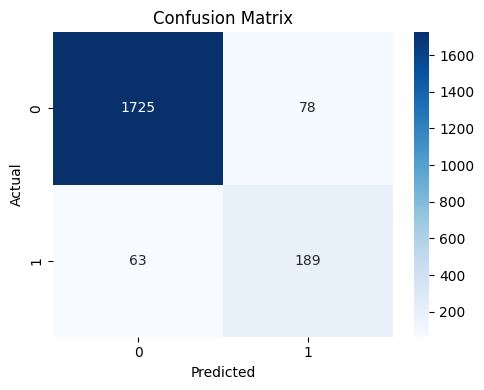

=== Model Benchmarking Results ===


,precision,recall,f1,TP,FP,FN,TN,pr_auc,rank
catboost,0.707865,0.750000,0.728324,189.000000,78.000000,63.000000,1725.000000,0.777361,1.0
lightgbm,0.729614,0.674603,0.701031,170.000000,63.000000,82.000000,1740.000000,0.774313,2.0
xgboost,0.717647,0.726190,0.721893,183.000000,72.000000,69.000000,1731.000000,0.774073,3.0
random_forest,0.620130,0.757937,0.682143,191.000000,117.000000,61.000000,1686.000000,0.754265,4.0
logistic,0.435644,0.873016,0.581242,220.000000,285.000000,32.000000,1518.000000,0.615895,7.0
dummy,0.157340,0.769841,0.261279,194.000000,1039.000000,58.000000,764.000000,0.143874,8.0
mean_all,0.561373,0.758598,0.612652,191.166667,275.666667,60.833333,1527.333333,0.639964,6.0
mean_no_baseline,0.667326,0.733466,0.689209,184.833333,121.133333,67.166667,1681.866667,0.743995,5.0


In [31]:
results = run_benchmark_pipeline(df_btc_price, verbose=True, plot_confusion=True)

results_df = pd.DataFrame(results).T
results_df = results_df.sort_values("pr_auc", ascending=False)

# =========================
# ADD SUMMARY ROWS
# =========================

# Mean over all models
results_df.loc["mean_all"] = results_df.mean()

# Mean without baselines (dummy + logistic)
results_df.loc["mean_no_baseline"] = results_df.drop(
    index=["dummy", "logistic"], errors="ignore"
).mean()

# Ranking
results_df["rank"] = results_df["pr_auc"].rank(ascending=False)

print("=== Model Benchmarking Results ===")
results_df